# 散布図・バブルチャート

## 概要

**散布図（Scatter）** とは，主に二つの量的変数に対して，一つ一つのデータを **ドットの位置** で表すグラフです．
ドットの **色** で三つ目の変数を表現することもあります．

![](../figs/charts/scatter.png)

例えば上図は，作品の

- 横軸：平均掲載位置
- 縦軸：掲載週数
- 色：雑誌

を表した散布図です．

**バブルチャート（Bubble Chart)** とは，散布図を拡張し， **ドットの大きさ** を利用することで三つ目の量的変数を表現するグラフです．
ただし，「ドットの大きさ」に関しては，（全体的な傾向は掴めるものの）個別の比較は難しいことにご注意ください．

![](../figs/charts/bubble.png)

例えば上図は，作品の
- 横軸：平均掲載位置
- 縦軸：連載週数
- 色：雑誌
- 大きさ：平均ページ数

を表したバブルチャートです．
平均掲載位置や連載週数の比較は容易ですが，個別の作品の平均ページ数を比較するのは非常に難しいことがわかります．

## Plotlyによる作図方法

Plotlyにおいては，`plotly.express.scatter()`を用いて散布図やバブルチャートを作図できます．

```python
import plotly.express as px
fig = px.scatter(
    df, x='col_x', y='col_y')
```

上記の例では，`df`の`col_x`列を横軸，`col_y`列を縦軸に取った散布図のオブジェクト`fig`を作成します．
更に，三つ目の変数に相当する列を`size`で指定することで，

```python
fig = px.scatter(
    df, x='col_x', y='col_y', size='col_size')
```

バブルチャートのオブジェクト`fig`を作成できます．

## MADB Labを用いた作図例

### 下準備

In [1]:
import pandas as pd
import plotly.express as px

import warnings
warnings.filterwarnings('ignore')

In [2]:
# 前処理の結果，以下に分析対象ファイルが格納されていることを想定
PATH_DATA = '../../data/preprocess/out/episodes.csv'
# Jupyter Book用のPlotlyのrenderer
RENDERER = 'plotly_mimetype+notebook'

In [3]:
# 連載週数の最小値
MIN_WEEKS = 5

In [20]:
def show_fig(fig, adjust_legend=True):
    """Jupyter Bookでも表示可能なようRendererを指定"""
    fig.update_layout(margin=dict(t=50, l=25, r=25, b=25))
    if adjust_legend:
        fig.update_layout(legend={
            'yanchor': 'top',
            'xanchor': 'left',
            'x': 0.01, 'y': 0.99})
    fig.show(renderer=RENDERER)

In [5]:
df = pd.read_csv(PATH_DATA)

### 作品別の平均掲載位置と連載週数

In [6]:
df_plot = \
    df.groupby('cname')['pageStartPosition'].\
    agg(['count', 'mean']).reset_index()
df_plot.columns = ['cname', 'weeks', 'position']
df_plot = \
    df_plot[df_plot['weeks'] >= MIN_WEEKS].reset_index(drop=True)

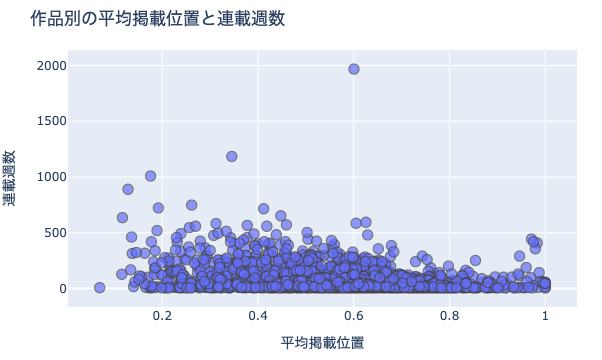

In [7]:
fig = px.scatter(
    df_plot, x='position', y='weeks', opacity=0.7, 
    hover_data=['cname'], title='作品別の平均掲載位置と連載週数')
fig.update_traces(
    marker={'size': 10, 'line_width':1,})
fig.update_xaxes(title='平均掲載位置')
fig.update_yaxes(title='連載週数')
show_fig(fig)

### 雑誌別・作品別の平均掲載位置と連載週数

In [8]:
df_plot = \
    df.groupby(['mcname', 'cname'])['pageStartPosition'].\
    agg(['count', 'mean']).reset_index()
df_plot.columns = ['mcname', 'cname', 'weeks', 'position']
df_plot = \
    df_plot[df_plot['weeks'] >= MIN_WEEKS].reset_index(drop=True)

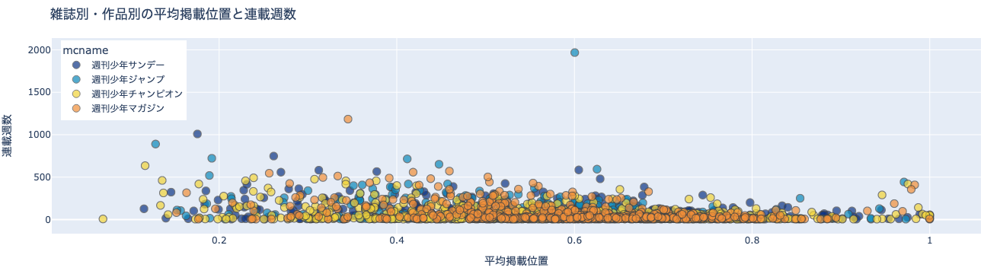

In [9]:
fig = px.scatter(
    df_plot, x='position', y='weeks', color='mcname', 
    opacity=0.7,
    hover_data=['cname'], 
    color_discrete_sequence= px.colors.diverging.Portland,
    title='雑誌別・作品別の平均掲載位置と連載週数')
fig.update_traces(
    marker={'size': 10, 'line_width':1})
fig.update_xaxes(title='平均掲載位置')
fig.update_yaxes(title='連載週数')
show_fig(fig)

### 雑誌別・作品別の平均掲載位置と連載週数と平均ページ数（バブルチャート）

In [12]:
df_plot = \
    df.groupby(['mcname', 'cname'])\
    [['pages', 'pageStartPosition']].\
    agg(['count', 'mean']).reset_index()
df_plot.columns = [
    'mcname', 'cname', 'weeks', 'pages',
    '_weeks', 'position']
df_plot = \
    df_plot[df_plot['weeks'] >= MIN_WEEKS].reset_index(drop=True)

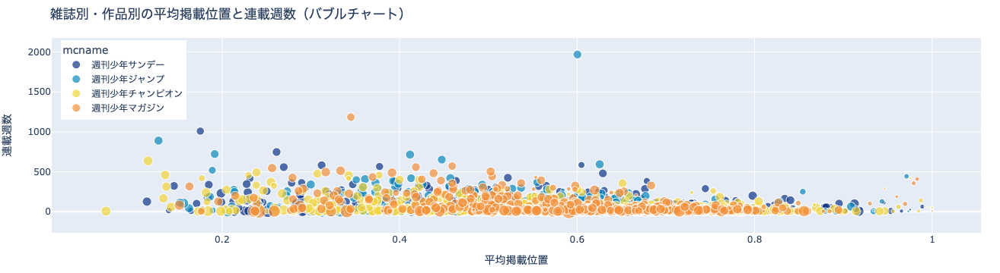

In [14]:
fig = px.scatter(
    df_plot, x='position', y='weeks', color='mcname',
    size='pages', opacity=0.7,
    color_discrete_sequence= px.colors.diverging.Portland,
    hover_data=['cname'], 
    title='雑誌別・作品別の平均掲載位置と連載週数（バブルチャート）')
fig.update_traces(
    marker={'line_width':1})
fig.update_xaxes(title='平均掲載位置')
fig.update_yaxes(title='連載週数')

show_fig(fig)

### 雑誌別・作品別の平均掲載位置と連載週数と平均ページ数（散布図行列）

In [22]:
df_plot = \
    df.groupby(['mcname', 'cname'])\
    [['pages', 'pageStartPosition']].\
    agg(['count', 'mean']).reset_index()
df_plot.columns = [
    'mcname', 'cname', 'weeks', 'pages',
    '_weeks', 'position']
df_plot = df_plot[[
    'mcname', 'position', 'pages', 'weeks']]
df_plot = \
    df_plot[df_plot['weeks'] >= MIN_WEEKS].reset_index(drop=True)

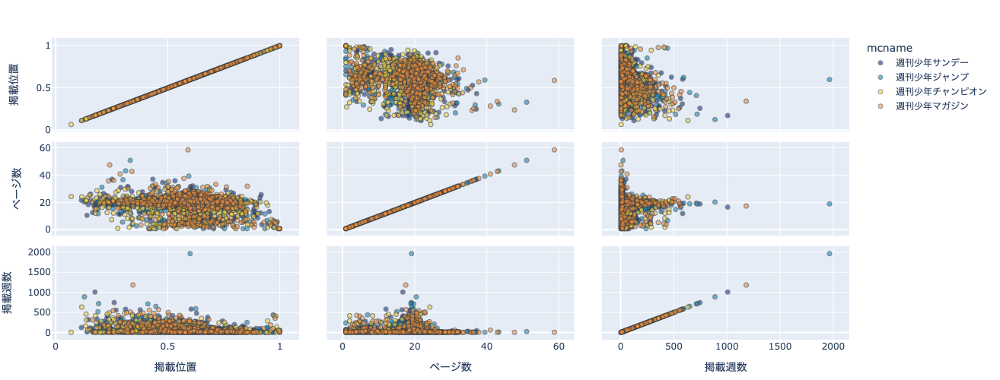

In [23]:
fig = px.scatter_matrix(
    df_plot, dimensions=['position', 'pages', 'weeks'], 
    color='mcname', opacity=0.6, height=500,
    color_discrete_sequence= px.colors.diverging.Portland,
    labels={
        'position': '掲載位置', 'weeks': '掲載週数',
        'pages': 'ページ数'})
fig.update_traces(marker={'line_width':1})
show_fig(fig, adjust_legend=False)

バブルチャートではおぼろげにしかわからなかった

- 平均ページ数の分布
- 平均ページ数と他の変数との関係

がよくわかるようになりました．
一つ一つの散布図が小さくなってしまうという欠点がありますが，個人的には，バブルチャートより散布図行列を使うことが多いです．